In [1]:
try:
  import torch
  import torchvision
  assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
  assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
  print(f"torch version: {torch.__version__}")
  print(f"torchvision version: {torchvision.__version__}")
except:
  print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
  !pip3 install -U torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
  import torch
  import torchvision
  print(f"torch version: {torch.__version__}")
  print(f"torchvision version: {torchvision.__version__}")

torch version: 2.13.0+cu130
torchvision version: 0.28.0+cu130


In [2]:
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [5]:
import os
import zipfile
import requests

from pathlib import Path

def download_data(
    source: str,
    destination: str,
    remove_source: bool = True
) -> Path:
  """Downloads a zipped dataset from source and unzips to destination.

  Args:
      source (str): A link to a zipped file containing data.
      destination (str): A target directory to unzip data to.
      remove_source (bool): Whether to remove the source after downloading and extracting.

  Returns:
      pathlib.Path to downloaded data.

  Example usage:
      download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                    destination="pizza_steak_sushi")
  """
  data_path = Path("data")
  image_path = data_path / destination

  if image_path.is_dir():
      print(f"[INFO] {image_path} directory exists, skipping download.")
  else:
      print(f"[INFO] Did not find {image_path} directory, creating one...")
      image_path.mkdir(parents=True, exist_ok=True)

      target_file = Path(source).name
      with open(data_path / target_file, "wb") as f:
          request = requests.get(source)
          print(f"[INFO] Downloading {target_file} from {source}...")
          f.write(request.content)

      with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
          print(f"[INFO] Unzipping {target_file} data...")
          zip_ref.extractall(image_path)

      if remove_source:
        os.remove(data_path / target_file)

  return image_path

image_path = download_data(
    source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
    destination="pizza_sushi_steak"
)

image_path

[INFO] data/pizza_sushi_steak directory exists, skipping download.


PosixPath('data/pizza_sushi_steak')

In [6]:
train_dir = image_path / 'train'
test_dir = image_path / 'test'

normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

manual_transforms = transforms.Compose([
  transforms.Resize((224,224)),
  transforms.ToTensor(),
  normalize
])
print(f"Manually created transforms: {manual_transforms}")

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=manual_transforms,
    batch_size=32
)

train_dataloader, test_dataloader, class_names

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


(<torch.utils.data.dataloader.DataLoader at 0x782979b38d70>,
 ['pizza', 'steak', 'sushi'])

In [7]:
train_dir = image_path / 'train'
test_dir = image_path / 'test'

weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
auto_transforms = weights.transforms()
print(f"Automatically created transforms: {auto_transforms}")

train_dataloader, test_dataloader, data_classes = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=auto_transforms,
    batch_size=32
)

train_dataloader, test_dataloader, data_classes

Automatically created transforms: ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


(<torch.utils.data.dataloader.DataLoader at 0x782979c2e850>,
 ['pizza', 'steak', 'sushi'])

In [8]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

In [9]:
for param in model.features.parameters():
  param.requires_grad = False

set_seeds()

model.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
  	nn.Linear(in_features=1280, out_features=len(data_classes), bias=True)
).to(device)

In [10]:
from torchinfo import summary

summary(model=model,
  input_size=(32,3,224,224),
  col_names=["input_size", "output_size", "num_params", "trainable"],
  col_width=20,
  row_settings=["var_names"],
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [11]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [12]:
try:
    from torch.utils.tensorboard import SummaryWriter
except:
    print("[INFO] Couldn't find tensorboard... installing it.")
    !pip install -q tensorboard
    from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter()

In [13]:
from typing import Dict, List
from tqdm.auto import tqdm

from going_modular.going_modular.engine import train_step, test_step

def train(
    model: torch.nn.Module,
    train_dataloader: torch.utils.data.DataLoader,
    test_dataloader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    loss_fn: torch.nn.Module,
    epochs: int,
    writer: torch.utils.tensorboard.writer.SummaryWriter,
    device: torch.device
) -> Dict[str, List]:
  """Trains and tests a PyTorch model.

  Passes a target PyTorch models through train_step() and test_step()
  functions for a number of epochs, training and testing the model
  in the same epoch loop.

  Calculates, prints and stores evaluation metrics throughout.

  Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
            {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
  """
  results = {"train_loss": [],
      "train_acc": [],
      "test_loss": [],
      "test_acc": []
  }

  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(
        model=model,
        dataloader=train_dataloader,
        loss_fn=loss_fn,
        optimizer=optimizer,
        device=device
    )

    test_loss, test_acc = test_step(
        model=model,
        dataloader=test_dataloader,
        loss_fn=loss_fn,
        device=device
    )

    print(
        f"Epoch: {epoch+1} | "
        f"train_loss: {train_loss:.4f} | "
        f"train_acc: {train_acc:.4f} | "
        f"test_loss: {test_loss:.4f} | "
        f"test_acc: {test_acc:.4f}"
    )

    results["train_loss"].append(train_loss)
    results["train_acc"].append(train_acc)
    results["test_loss"].append(test_loss)
    results["test_acc"].append(test_acc)

    writer.add_scalars("Loss", {"train_loss": train_loss, "test_loss": test_loss}, epoch)
    writer.add_scalars("Accuracy", {"train_acc": train_acc, "test_acc": test_acc}, epoch)
    writer.add_graph(model=model, input_to_model=torch.randn(32,3,224,224).to(device))

  writer.close()

  return results

In [14]:
set_seeds()

results = train(
    model=model,
    train_dataloader=train_dataloader,
    test_dataloader=test_dataloader,
    optimizer=optimizer,
    loss_fn=loss_fn,
    epochs=5,
    writer=writer,
    device=device
)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0924 | train_acc: 0.3984 | test_loss: 0.9133 | test_acc: 0.5398
Epoch: 2 | train_loss: 0.8975 | train_acc: 0.6562 | test_loss: 0.7837 | test_acc: 0.8561
Epoch: 3 | train_loss: 0.8038 | train_acc: 0.7461 | test_loss: 0.6723 | test_acc: 0.8864
Epoch: 4 | train_loss: 0.6770 | train_acc: 0.8516 | test_loss: 0.6699 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7065 | train_acc: 0.7188 | test_loss: 0.6746 | test_acc: 0.7737


In [15]:
results

{'train_loss': [1.0924270451068878,
  0.8974936604499817,
  0.8037795796990395,
  0.6769560873508453,
  0.7065098136663437],
 'train_acc': [0.3984375, 0.65625, 0.74609375, 0.8515625, 0.71875],
 'test_loss': [0.9132681091626486,
  0.7837486267089844,
  0.6723187565803528,
  0.6698531905810038,
  0.6746144890785217],
 'test_acc': [0.5397727272727273,
  0.8560606060606061,
  0.8863636363636364,
  0.8049242424242425,
  0.7736742424242425]}

In [16]:
print('[INFO] Attempting to fix tensorboard import issue...')
!pip install --upgrade setuptools
!pip install --ignore-installed tensorboard

[INFO] Attempting to fix tensorboard import issue...
  Using cached tensorboard-2.21.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached absl_py-2.5.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached grpcio-1.83.0-cp313-cp313-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (3.7 kB)
  Using cached markdown-3.10.3-py3-none-any.whl.metadata (5.1 kB)
  Using cached numpy-2.5.2-cp313-cp313-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (6.6 kB)
  Using cached packaging-26.3-py3-none-any.whl.metadata (3.5 kB)
  Using cached pillow-12.3.0-cp313-cp313-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (9.1 kB)
  Using cached protobuf-7.36.0-cp310-abi3-manylinux2014_x86_64.whl.metadata (595 bytes)
  Using cached setuptools-84.0.0-py3-none-any.whl.metadata (6.6 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-manylinux_2_31_x86_64.whl.metadata (1.1 kB)
  Using cached werkzeug-3.1.8-py3-none-any.whl.metadata (4.0 kB)
  Using cached typing_extensions-4.16.0-py3-no

In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
def create_writer(
    experiment_name: str,
    model_name: str,
    extra: str=None
) -> torch.utils.tensorboard.writer.SummaryWriter:
  """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

  log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

  Where timestamp is the current date in YYYY-MM-DD format.

  Args:
      experiment_name (str): Name of experiment.
      model_name (str): Name of model.
      extra (str, optional): Anything extra to add to the directory. Defaults to None.

  Returns:
      torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

  Example usage:
      # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
      writer = create_writer(experiment_name="data_10_percent",
                              model_name="effnetb2",
                              extra="5_epochs")
      # The above is the same as:
      writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
  """
  from datetime import datetime

  timestamp = datetime.now().strftime("%Y-%m-%d")
  if extra:
      log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
  else:
      log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

  print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
  return SummaryWriter(log_dir=log_dir)

In [19]:
example_writer = create_writer(
    experiment_name="data_10_percent",
    model_name="effnetb0",
    extra="5_epochs"
)

[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_10_percent/effnetb0/5_epochs...


In [20]:
data_10_percent_path = download_data(
    source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
    destination="pizza_sushi_steak"
)

data_20_percent_path = download_data(
    source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
    destination="pizza_sushi_steak_20_percent"
)

[INFO] data/pizza_sushi_steak directory exists, skipping download.
[INFO] data/pizza_sushi_steak_20_percent directory exists, skipping download.


In [21]:
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

test_dir = data_10_percent_path / "test"

print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_sushi_steak/train
Training directory 20%: data/pizza_sushi_steak_20_percent/train
Testing directory: data/pizza_sushi_steak/test


In [22]:
from torchvision import transforms

normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

simple_transforms = transforms.Compose([
    transforms.Resize((224,224)),
  	transforms.ToTensor(),
  	normalize
])

In [23]:
BATCH_SIZE = 32

train_dataloader_10_percent, test_dataloader_10_percent, class_names = data_setup.create_dataloaders(
    train_dir=train_dir_10_percent,
    test_dir=test_dir,
    transform=simple_transforms,
    batch_size=BATCH_SIZE
)

train_dataloader_20_percent, test_dataloader_20_percent, class_names = data_setup.create_dataloaders(
    train_dir=train_dir_20_percent,
    test_dir=test_dir,
    transform=simple_transforms,
    batch_size=BATCH_SIZE
)

print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(test_dataloader)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 10 percent training data: 8
Number of batches of size 32 in 20 percent training data: 15
Number of batches of size 32 in testing data: 3 (all experiments will use the same test set)
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


In [24]:
import torchvision
from torchinfo import summary

effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights)

summary(
  model=effnetb2,
  input_size=(32,3,224,224),
  col_names=["input_size", "output_size", "num_params", "trainable"],
  col_width=20,
  row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [25]:
import torchvision
from torch import nn

OUT_FEATURES = len(class_names)

def create_effnetb0():
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights=weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()

  model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

  model.name = "effnetb0"
  print(f"[INFO] Created new {model.name} model.")
  return model


def create_effnetb2():
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model = torchvision.models.efficientnet_b2(weights=weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p=0.3),
      nn.Linear(in_features=1408, out_features=OUT_FEATURES)
  ).to(device)

  model.name = "effnetb2"
  print(f"[INFO] Created new {model.name} model.")
  return model

In [26]:
effnetb0 = create_effnetb0()
effnetb2 = create_effnetb2()

[INFO] Created new effnetb0 model.
[INFO] Created new effnetb2 model.


In [27]:
num_epochs = [5, 10]
models = ["effnetb0", "effnetb2"]

train_dataloaders = {
    "data_10_percent": train_dataloader_10_percent,
    "data_20_percent": train_dataloader_20_percent
}

In [28]:
%%time
from going_modular.going_modular.utils import save_model

set_seeds(42)

experiment_number = 0

for dataloader_name, train_dataloade in train_dataloaders.items():
  for epochs in num_epochs:
    for model_name in models:
      experiment_number += 1
      print(f"[INFO] Experiment number: {experiment_number}")
      print(f"[INFO] Model: {model_name}")
      print(f"[INFO] DataLoader: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")

      if model_name == "effnetb0":
        model = create_effnetb0()
      else:
        model = create_effnetb2()

      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

      train(
          model=model,
          train_dataloader=train_dataloade,
          test_dataloader=test_dataloader,
          optimizer=optimizer,
          loss_fn=loss_fn,
          epochs=epochs,
          writer=create_writer(
              experiment_name=dataloader_name,
              model_name=model_name,
              extra=f"{epochs}_epochs"
          ),
          device=device
      )

      save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(
          model=model,
          target_dir="models",
          model_name=save_filepath
      )
      print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_10_percent/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.8890 | test_acc: 0.5805
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8375 | test_acc: 0.5900
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7382 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6469 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.6200 | test_acc: 0.9062
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_10_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0928 | train_acc: 0.3711 | test_loss: 0.9589 | test_acc: 0.6402
Epoch: 2 | train_loss: 0.9089 | train_acc: 0.6406 | test_loss: 0.9040 | test_acc: 0.7140
Epoch: 3 | train_loss: 0.8453 | train_acc: 0.6797 | test_loss: 0.8184 | test_acc: 0.8153
Epoch: 4 | train_loss: 0.7203 | train_acc: 0.8516 | test_loss: 0.7081 | test_acc: 0.8352
Epoch: 5 | train_loss: 0.7274 | train_acc: 0.7461 | test_loss: 0.6571 | test_acc: 0.8551
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_10_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0528 | train_acc: 0.4961 | test_loss: 0.8890 | test_acc: 0.5805
Epoch: 2 | train_loss: 0.9416 | train_acc: 0.5586 | test_loss: 0.8375 | test_acc: 0.5900
Epoch: 3 | train_loss: 0.8284 | train_acc: 0.6914 | test_loss: 0.7382 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7219 | train_acc: 0.7578 | test_loss: 0.6469 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6032 | train_acc: 0.8867 | test_loss: 0.6200 | test_acc: 0.9062
Epoch: 6 | train_loss: 0.5470 | train_acc: 0.8750 | test_loss: 0.6343 | test_acc: 0.7633
Epoch: 7 | train_loss: 0.6480 | train_acc: 0.7188 | test_loss: 0.6329 | test_acc: 0.7936
Epoch: 8 | train_loss: 0.5016 | train_acc: 0.9180 | test_loss: 0.5779 | test_acc: 0.8759
Epoch: 9 | train_loss: 0.4611 | train_acc: 0.8945 | test_loss: 0.5706 | test_acc: 0.8040
Epoch: 10 | train_loss: 0.5681 | train_acc: 0.7539 | test_loss: 0.5271 | test_acc: 0.8343
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0928 | train_acc: 0.3711 | test_loss: 0.9589 | test_acc: 0.6402
Epoch: 2 | train_loss: 0.9089 | train_acc: 0.6406 | test_loss: 0.9040 | test_acc: 0.7140
Epoch: 3 | train_loss: 0.8453 | train_acc: 0.6797 | test_loss: 0.8184 | test_acc: 0.8153
Epoch: 4 | train_loss: 0.7203 | train_acc: 0.8516 | test_loss: 0.7081 | test_acc: 0.8352
Epoch: 5 | train_loss: 0.7274 | train_acc: 0.7461 | test_loss: 0.6571 | test_acc: 0.8551
Epoch: 6 | train_loss: 0.6089 | train_acc: 0.7656 | test_loss: 0.6625 | test_acc: 0.8968
Epoch: 7 | train_loss: 0.5998 | train_acc: 0.8164 | test_loss: 0.6174 | test_acc: 0.8864
Epoch: 8 | train_loss: 0.5486 | train_acc: 0.8281 | test_loss: 0.6184 | test_acc: 0.8665
Epoch: 9 | train_loss: 0.5174 | train_acc: 0.7891 | test_loss: 0.5879 | test_acc: 0.8456
Epoch: 10 | train_loss: 0.5073 | train_acc: 0.8203 | test_loss: 0.5753 | test_acc: 0.8968
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6415 | test_acc: 0.9062
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.5801 | test_acc: 0.9271
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.5180 | test_acc: 0.9271
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4363 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.3987 | test_acc: 0.9072
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_20_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9830 | train_acc: 0.5521 | test_loss: 0.7751 | test_acc: 0.8655
Epoch: 2 | train_loss: 0.7181 | train_acc: 0.7917 | test_loss: 0.6612 | test_acc: 0.8759
Epoch: 3 | train_loss: 0.5791 | train_acc: 0.8771 | test_loss: 0.5764 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.5310 | train_acc: 0.8333 | test_loss: 0.5331 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4890 | train_acc: 0.8625 | test_loss: 0.4684 | test_acc: 0.9176
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-08-26/data_20_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9576 | train_acc: 0.6188 | test_loss: 0.6415 | test_acc: 0.9062
Epoch: 2 | train_loss: 0.7022 | train_acc: 0.8063 | test_loss: 0.5801 | test_acc: 0.9271
Epoch: 3 | train_loss: 0.5836 | train_acc: 0.8375 | test_loss: 0.5180 | test_acc: 0.9271
Epoch: 4 | train_loss: 0.4559 | train_acc: 0.8938 | test_loss: 0.4363 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.4514 | train_acc: 0.8938 | test_loss: 0.3987 | test_acc: 0.9072
Epoch: 6 | train_loss: 0.4222 | train_acc: 0.8604 | test_loss: 0.4055 | test_acc: 0.8873
Epoch: 7 | train_loss: 0.3849 | train_acc: 0.8583 | test_loss: 0.3676 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.3451 | train_acc: 0.8938 | test_loss: 0.3599 | test_acc: 0.8769
Epoch: 9 | train_loss: 0.3723 | train_acc: 0.8917 | test_loss: 0.3637 | test_acc: 0.8873
Epoch: 10 | train_loss: 0.3593 | train_acc: 0.8938 | test_loss: 0.3121 | test_acc: 0.8759
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9830 | train_acc: 0.5521 | test_loss: 0.7751 | test_acc: 0.8655
Epoch: 2 | train_loss: 0.7181 | train_acc: 0.7917 | test_loss: 0.6612 | test_acc: 0.8759
Epoch: 3 | train_loss: 0.5791 | train_acc: 0.8771 | test_loss: 0.5764 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.5310 | train_acc: 0.8333 | test_loss: 0.5331 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4890 | train_acc: 0.8625 | test_loss: 0.4684 | test_acc: 0.9176
Epoch: 6 | train_loss: 0.3795 | train_acc: 0.9146 | test_loss: 0.4783 | test_acc: 0.8968
Epoch: 7 | train_loss: 0.3519 | train_acc: 0.9313 | test_loss: 0.4309 | test_acc: 0.8968
Epoch: 8 | train_loss: 0.3214 | train_acc: 0.9333 | test_loss: 0.4189 | test_acc: 0.9072
Epoch: 9 | train_loss: 0.3428 | train_acc: 0.8896 | test_loss: 0.4273 | test_acc: 0.9072
Epoch: 10 | train_loss: 0.3791 | train_acc: 0.8604 | test_loss: 0.3850 | test_acc: 0.9072
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

In [29]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 29395), started 0:05:56 ago. (Use '!kill 29395' to kill it.)

<IPython.core.display.Javascript object>

In [30]:
best_model_path = "models/07_effnetb2_data_20_percent_10_epochs.pth"

best_model = create_effnetb2()

best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model.


<All keys matched successfully>

In [31]:
from pathlib import Path

effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f"EfficientNetB2 feature extractor model size: {effnetb2_model_size} MB")

EfficientNetB2 feature extractor model size: 29 MB


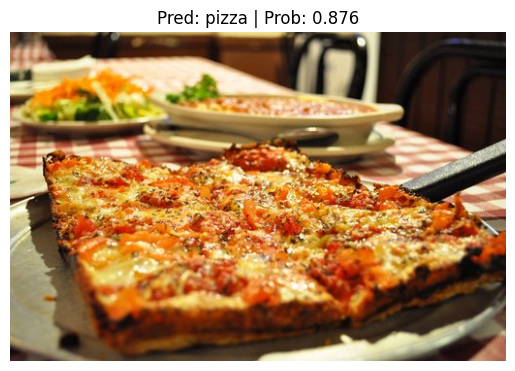

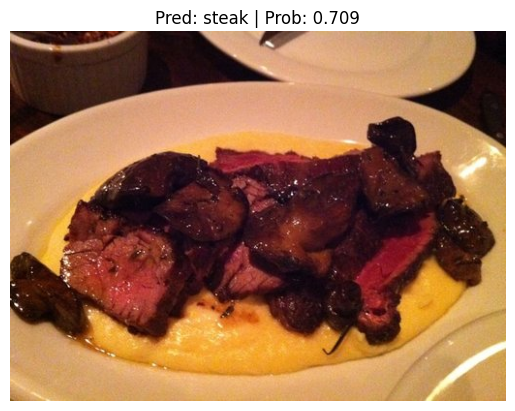

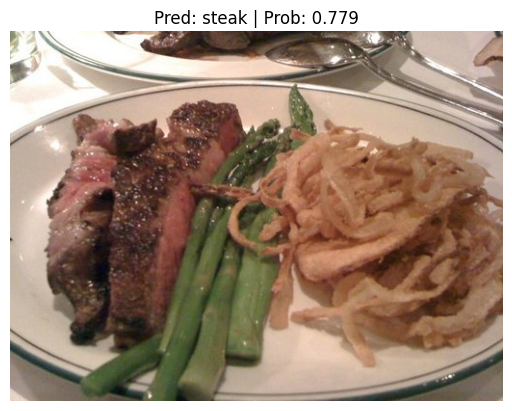

In [32]:
import random

from going_modular.going_modular.predictions import pred_and_plot_image

num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg"))
test_image_path_sample = random.sample(population=test_image_path_list, k=num_images_to_plot)

for image_path in test_image_path_sample:
  pred_and_plot_image(
      model=best_model,
      image_path=image_path,
      class_names=class_names,
      transform=simple_transforms,
      device=device
  )

[INFO] Removed existing data/04-pizza-dad.jpeg to re-download.
[INFO] Downloading data/04-pizza-dad.jpeg...


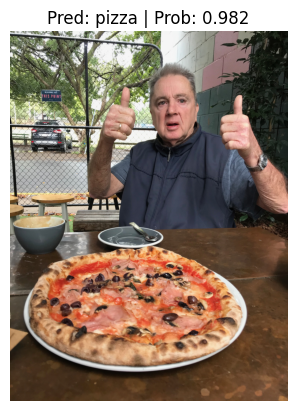

In [33]:
import requests
import os
from PIL import Image

custom_image_path = Path("data/04-pizza-dad.jpeg")

if custom_image_path.is_file():
    os.remove(custom_image_path)
    print(f"[INFO] Removed existing {custom_image_path} to re-download.")

with open(custom_image_path, "wb") as f:
  request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
  print(f"[INFO] Downloading {custom_image_path}...")
  f.write(request.content)

image = Image.open(custom_image_path)
if image.mode != "RGB":
    image = image.convert("RGB")
    image.save(custom_image_path)

pred_and_plot_image(
    model=best_model,
    image_path=custom_image_path,
    class_names=class_names
)